# 1. LeNet - 5



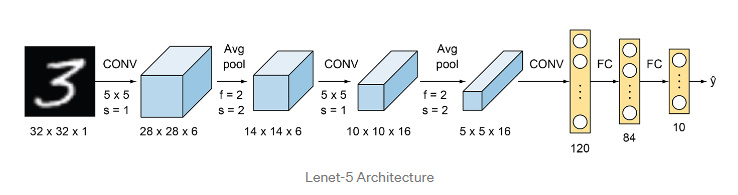

In [ ]:
%load_ext tensorboard

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
mnist = tf.keras.datasets.mnist
(X_train, y_train),(X_test, y_test) = mnist.load_data()

In [ ]:
X_train.shape

(60000, 28, 28)

In [ ]:
import numpy as np
X_mean = X_train.mean(axis=0, keepdims=True)
X_std = X_train.std(axis=0, keepdims=True) + 1e-7
X_train = (X_train - X_mean) / X_std

X_test = (X_test - X_mean) / X_std

X_train = X_train[..., np.newaxis]

X_test = X_test[..., np.newaxis]

In [ ]:
X_train.shape

(60000, 28, 28, 1)

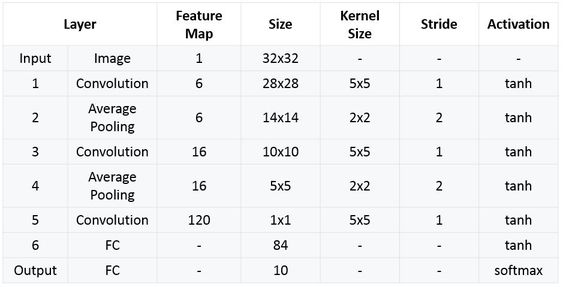

In [ ]:
#Layer 1 (28-5+2x2)/1 + 1 = 28
#Layer 2 (28-2)/2+1=14
#Layer 3 (14-5+2x0)/1+1=10
#Layer 4 (10-2)/2+1 =5
model = keras.models.Sequential([
    keras.layers.Conv2D(filters=6, kernel_size=5, strides=1,activation='tanh',padding="same",input_shape=[28,28,1]),
    keras.layers.AvgPool2D(pool_size=2),
    keras.layers.Conv2D(filters=16, kernel_size=5, strides=1,activation='tanh',padding="valid"),
    keras.layers.AvgPool2D(pool_size=2),
    keras.layers.Conv2D(filters=120, kernel_size=5, strides=1, activation='tanh', padding='valid'),
    keras.layers.Flatten(),
    keras.layers.Dense(units=84, activation='tanh'),
    keras.layers.Dense(units=10, activation='softmax')
])      

NameError: ignored

In [ ]:
"""
para_C1:  (5x5+1)x6      = 156
para_S2:                 = 0
para_C3:  (5x5x6+1)x16   = 2416         ==>> total = 61,706 parameter
para_S4:                 = 0
para_C5:  (5x5x16+1)x120 = 48120
para_FC6: 84x120+84      = 10164
para_FC7: 84x10+10       = 850
"""

In [ ]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_40 (Conv2D)          (None, 28, 28, 6)         156       
                                                                 
 average_pooling2d_2 (Averag  (None, 14, 14, 6)        0         
 ePooling2D)                                                     
                                                                 
 conv2d_41 (Conv2D)          (None, 10, 10, 16)        2416      
                                                                 
 average_pooling2d_3 (Averag  (None, 5, 5, 16)         0         
 ePooling2D)                                                     
                                                                 
 conv2d_42 (Conv2D)          (None, 1, 1, 120)         48120     
                                                                 
 flatten_9 (Flatten)         (None, 120)              

In [ ]:
import os
import datetime
logdir = os.path.join('logs',datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [ ]:
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
model.fit(X_train, y_train, epochs=2, validation_data=(X_test, y_test),callbacks=[tensorboard_callback])

Epoch 1/2
1875/1875 [==============================] - 51s 26ms/step - loss: 0.2112 - accuracy: 0.9361 - val_loss: 0.1116 - val_accuracy: 0.9670
Epoch 2/2
1875/1875 [==============================] - 50s 26ms/step - loss: 0.0854 - accuracy: 0.9737 - val_loss: 0.0781 - val_accuracy: 0.9747


In [ ]:
predictions = model.predict(X_test)
print(predictions[5])
print(np.argmax(predictions[5]))

[1.5873337e-06 9.9981278e-01 6.2997797e-06 4.1974267e-06 5.1772163e-06
 3.6399788e-07 6.5783993e-06 9.2307819e-05 3.8086058e-05 3.2645432e-05]
1


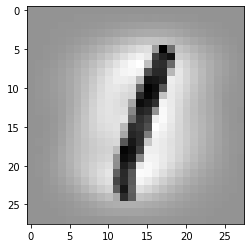

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(X_test[5].reshape(28,28),cmap=plt.cm.binary)
plt.show()

In [ ]:
%tensorboard --logdir logs

Output hidden; open in https://colab.research.google.com to view.

# 2. AlexNet

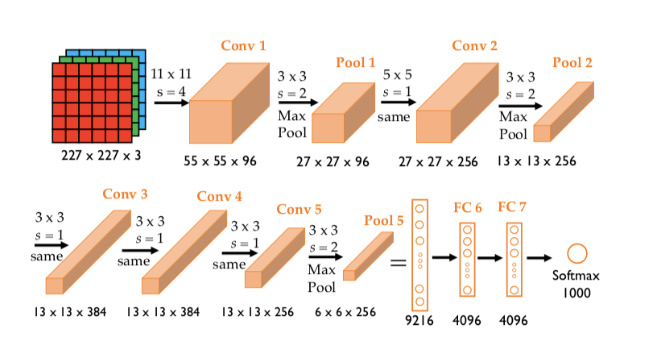

In [1]:
import tensorflow as tf
from tensorflow import keras

In [2]:
datasets = tf.keras.datasets
(x_train,y_train),(x_test,y_test) = datasets.mnist.load_data()
#padding 32x32 and scale
x_train = tf.pad(x_train, [[0, 0], [2,2], [2,2]])/255
x_test = tf.pad(x_test, [[0, 0], [2,2], [2,2]])/255
#Mở rộng thêm chiều
x_train = tf.expand_dims(x_train, axis=3, name=None)
x_test = tf.expand_dims(x_test, axis=3, name=None)
#Lặp lại để thành 3 kênh 
x_train = tf.repeat(x_train, 3, axis=3)
x_test = tf.repeat(x_test, 3, axis=3)

y_train = tf.keras.utils.to_categorical(y_train)

11501568/11490434 [==============================] - 0s 0us/step


In [3]:
x_train.shape

TensorShape([60000, 32, 32, 3])

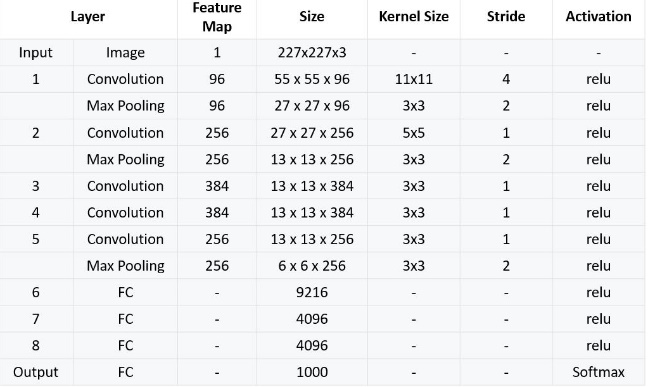

In [4]:
model = keras.models.Sequential([
    keras.layers.experimental.preprocessing.Resizing(227, 227, interpolation="bilinear", input_shape=[32,32,3]),
    keras.layers.Conv2D(filters=96, kernel_size=11, strides=4,padding="valid"),
    keras.layers.Lambda(tf.nn.local_response_normalization),
    keras.layers.Activation('relu'),
    keras.layers.MaxPool2D(pool_size=3,strides=2),
    keras.layers.Conv2D(filters=256, kernel_size=5, strides=1,padding="same"),
    keras.layers.Lambda(tf.nn.local_response_normalization),
    keras.layers.Activation('relu'),
    keras.layers.MaxPool2D(pool_size=3,strides=2),
    keras.layers.Conv2D(filters=384, kernel_size=3, strides=1, activation='relu', padding='same'),
    keras.layers.Conv2D(filters=384, kernel_size=3, strides=1, activation='relu', padding='same'),
    keras.layers.Conv2D(filters=256, kernel_size=3, strides=1, activation='relu', padding='same'),
    keras.layers.MaxPool2D(pool_size=3,strides=2),
    keras.layers.Flatten(),
    keras.layers.Dense(units=4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(units=4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(units=10, activation='softmax')
])    

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing (Resizing)         (None, 227, 227, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 55, 55, 96)        34944     
                                                                 
 lambda (Lambda)             (None, 55, 55, 96)        0         
                                                                 
 activation (Activation)     (None, 55, 55, 96)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 27, 27, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 27, 27, 256)       614656    
                                                        

In [ ]:
model.compile(loss='categorical_crossentropy',optimizer='adam', metrics=['accuracy'])

In [ ]:
datagen=tf.keras.preprocessing.image.ImageDataGenerator(
                  rotation_range=10,
                  width_shift_range=0.1,
                  height_shift_range=0.1,
                  shear_range=0.1,
                  zoom_range=0.1,validation_split=0.2)
datagen.fit(x_train)

In [ ]:
train_generator = datagen.flow(x_train,y_train,batch_size=32,subset='training')
valid_generator = datagen.flow(x_train,y_train,batch_size=32,subset='validation')

In [ ]:
len(x_train)

60000

In [ ]:
#Sinh maximum 48000 anh3
model.fit(train_generator,
         validation_data=valid_generator,
         steps_per_epoch=(0.8*len(x_train))//32,
         epochs=2)

Epoch 1/2
1500/1500 [==============================] - 335s 217ms/step - loss: 0.3952 - accuracy: 0.8669 - val_loss: 0.1090 - val_accuracy: 0.9663
Epoch 2/2
1500/1500 [==============================] - 322s 215ms/step - loss: 0.1219 - accuracy: 0.9642 - val_loss: 0.1000 - val_accuracy: 0.9701


In [ ]:
predictions = model.predict(x_test)
print(predictions[5])
import numpy as np
print(np.argmax(predictions[5]))

[4.3514753e-10 1.0000000e+00 6.1832459e-09 4.9574015e-11 2.2427615e-09
 2.7476819e-11 5.1686215e-09 1.5381609e-08 5.5414313e-09 2.4322344e-09]
1


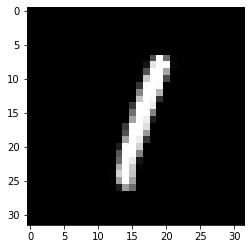

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(x_test[5],cmap=plt.cm.binary)
plt.show()

# 3. Inception Net

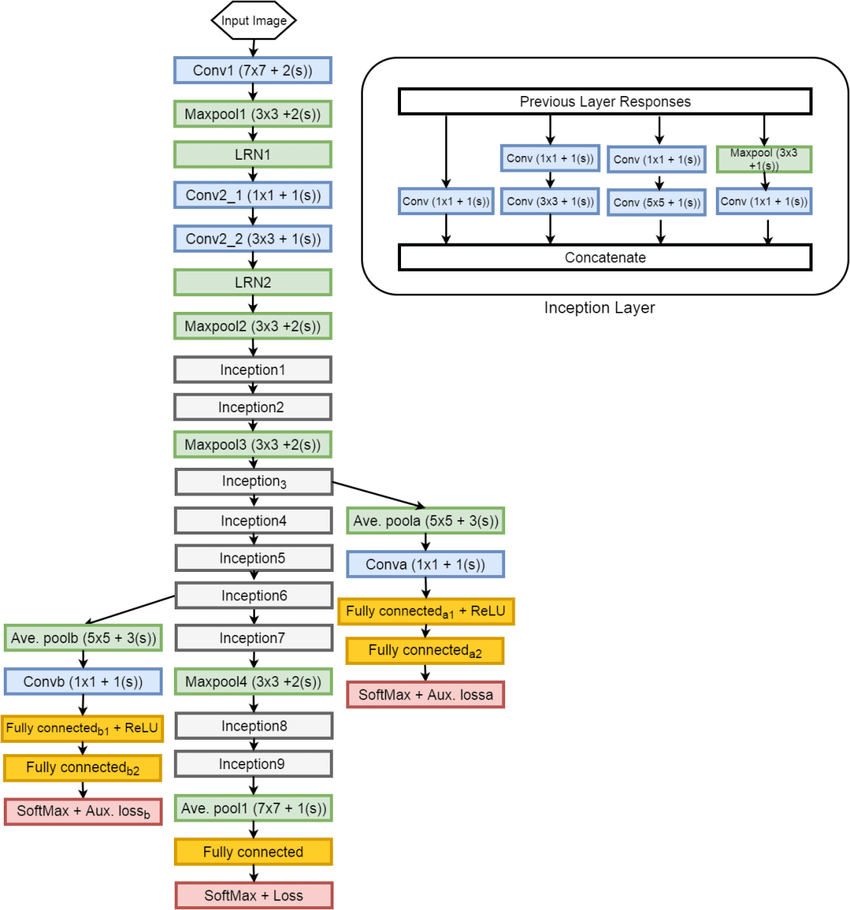



* **Chúng ta cần đi sâu hơn trong nhiều layer là tên gọi của mạng này. Mục đích muốn mạng CNN học được rộng (wide) hơn nữa.**

* **Kiến trúc đặc biệt ở khối inception gồm 3 kernel 1x1, 3x3, 5x5 giúp học được nhiều đặc trưng hơn từ chi tiết nhỏ, đến chi tiết lớn trong bức ảnh. Kèm theo đó một kỹ thuật giúp giảm chiều của kênh bằng cách nhân với kernel 1x1 giúp giảm fillter ban đầu.Xây dựng hàm auxiliary để tránh hiện tượng biến mất gradient ở backpropagation giữa mô hình.**







In [ ]:
import tensorflow as tf

In [ ]:
(X_train, y_train), (X_test, y_test)=tf.keras.datasets.cifar10.load_data()

170508288/170498071 [==============================] - 3s 0us/step


In [ ]:
X_train.shape,X_test.shape

((50000, 32, 32, 3), (10000, 32, 32, 3))

In [ ]:
y_train = tf.keras.utils.to_categorical(y_train)
y_test = tf.keras.utils.to_categorical(y_test)

In [ ]:
y_train.shape,y_test.shape

((50000, 10), (10000, 10))

In [ ]:
X_train = X_train.astype('float32')
X_test = X_train.astype('float32')
X_train=X_train/255.0
X_test=X_test/255.0

In [ ]:
def inception_layer(x,filters_1x1,filters_3x3_reduce,filters_3x3,filters_5x5_reduce,filters_5x5,filters_pool,name=None):
    conv_1x1 = tf.keras.layers.Conv2D(filters_1x1, (1, 1), padding='same', activation='relu')(x)
    
    conv_3x3 = tf.keras.layers.Conv2D(filters_3x3_reduce, (1, 1), padding='same', activation='relu')(x)
    conv_3x3 = tf.keras.layers.Conv2D(filters_3x3, (3, 3), padding='same', activation='relu')(conv_3x3)

    conv_5x5 = tf.keras.layers.Conv2D(filters_5x5_reduce, (1, 1), padding='same', activation='relu')(x)
    conv_5x5 = tf.keras.layers.Conv2D(filters_5x5, (5, 5), padding='same', activation='relu')(conv_5x5)

    pool_1x1 = tf.keras.layers.MaxPool2D((3, 3), strides=(1, 1), padding='same')(x)
    pool_1x1 = tf.keras.layers.Conv2D(filters_pool, (1, 1), padding='same', activation='relu')(pool_1x1)

    concat = tf.keras.layers.concatenate([conv_1x1, conv_3x3, conv_5x5, pool_1x1], axis=3, name=name)
    
    return concat

**Example: Inception 1 Architeture**
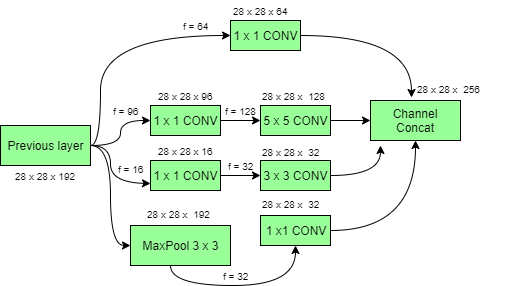

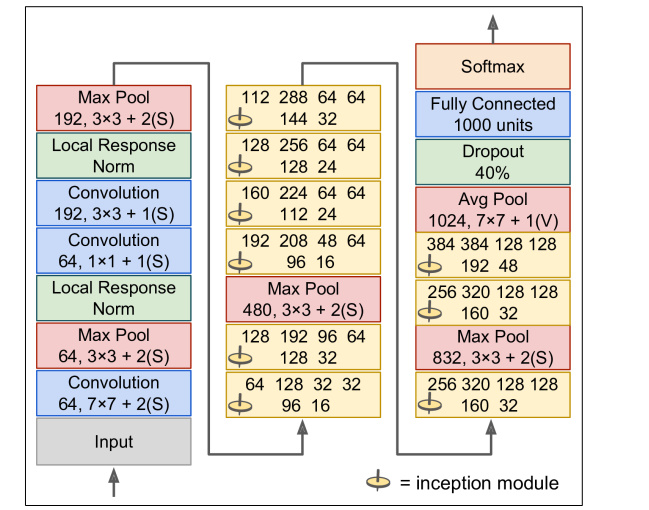

In [ ]:
input_orgin = tf.keras.layers.Input(shape=(32, 32, 3))
input_resize = tf.keras.layers.experimental.preprocessing.Resizing(224, 224,
interpolation="bilinear",input_shape=(32,32,3))(input_orgin)
x = tf.keras.layers.Conv2D(64, (7, 7), padding='same', strides=(2, 2), activation='relu')(input_resize)
x = tf.keras.layers.MaxPool2D((3, 3), padding='same', strides=(2, 2))(x)
x = tf.keras.layers.Conv2D(64, (1, 1), padding='same', strides=(1, 1), activation='relu')(x)
x = tf.keras.layers.Conv2D(192, (3, 3), padding='same', strides=(1, 1), activation='relu')(x)
x = tf.keras.layers.MaxPool2D((3, 3), padding='same', strides=(2, 2))(x)
#Inception 1
x = inception_layer(x,
                     filters_1x1=64,
                     filters_3x3_reduce=96,
                     filters_3x3=128,
                     filters_5x5_reduce=16,
                     filters_5x5=32,
                     filters_pool=32,
                     name='inception_1')
#Inception 2
x = inception_layer(x,
                     filters_1x1=128,
                     filters_3x3_reduce=128,
                     filters_3x3=192,
                     filters_5x5_reduce=32,
                     filters_5x5=96,
                     filters_pool=64,
                     name='inception_2')
x = tf.keras.layers.MaxPool2D((3, 3), padding='same', strides=(2, 2))(x)
#Inception 3
x = inception_layer(x,
                     filters_1x1=192,
                     filters_3x3_reduce=96,
                     filters_3x3=208,
                     filters_5x5_reduce=16,
                     filters_5x5=48,
                     filters_pool=64,
                     name='inception_3')
# Rẽ nhánh xây dựng hàm auxilliary 1
aux1 = tf.keras.layers.AveragePooling2D((5, 5), strides=3)(x)
aux1 = tf.keras.layers.Conv2D(128, (1, 1), padding='same', activation='relu')(aux1)
aux1 = tf.keras.layers.Flatten()(aux1)
aux1 = tf.keras.layers.Dense(1024, activation='relu')(aux1)
aux1 = tf.keras.layers.Dropout(0.7)(aux1)
aux1 = tf.keras.layers.Dense(10, activation='softmax', name='auxilliary_1')(aux1)
#Inception 4
x = inception_layer(x,
                     filters_1x1=160,
                     filters_3x3_reduce=112,
                     filters_3x3=224,
                     filters_5x5_reduce=24,
                     filters_5x5=64,
                     filters_pool=64,
                     name='inception_4')
#Inception 5
x = inception_layer(x,
                     filters_1x1=128,
                     filters_3x3_reduce=128,
                     filters_3x3=256,
                     filters_5x5_reduce=24,
                     filters_5x5=64,
                     filters_pool=64,
                     name='inception_5')
#Inception 6
x = inception_layer(x,
                     filters_1x1=112,
                     filters_3x3_reduce=144,
                     filters_3x3=288,
                     filters_5x5_reduce=32,
                     filters_5x5=64,
                     filters_pool=64,
                     name='inception_6')
# Rẽ nhánh xây dựng hàm auxilliary 2
aux2 = tf.keras.layers.AveragePooling2D((5, 5), strides=3)(x)
aux2 = tf.keras.layers.Conv2D(128, (1, 1), padding='same', activation='relu')(aux2)
aux2 = tf.keras.layers.Flatten()(aux2)
aux2 = tf.keras.layers.Dense(1024, activation='relu')(aux2)
aux2 = tf.keras.layers.Dropout(0.7)(aux2)
aux2 = tf.keras.layers.Dense(10, activation='softmax', name='auxilliary_2')(aux2)
#Inception 7
x = inception_layer(x,
                     filters_1x1=256,
                     filters_3x3_reduce=160,
                     filters_3x3=320,
                     filters_5x5_reduce=32,
                     filters_5x5=128,
                     filters_pool=128,
                     name='inception_7')
x = tf.keras.layers.MaxPool2D((3, 3), padding='same', strides=(2, 2))(x)
#Inception 8
x = inception_layer(x,
                     filters_1x1=256,
                     filters_3x3_reduce=160,
                     filters_3x3=320,
                     filters_5x5_reduce=32,
                     filters_5x5=128,
                     filters_pool=128,
                     name='inception_5a')
#Inception 9
x = inception_layer(x,
                     filters_1x1=384,
                     filters_3x3_reduce=192,
                     filters_3x3=384,
                     filters_5x5_reduce=48,
                     filters_5x5=128,
                     filters_pool=128,
                     name='inception_5b')
x = tf.keras.layers.GlobalAveragePooling2D()(x)

x = tf.keras.layers.Dropout(0.4)(x)

x = tf.keras.layers.Dense(10, activation='softmax')(x)

In [ ]:
model = tf.keras.models.Model(inputs=input_orgin, outputs=[x, aux1, aux2])

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 resizing_1 (Resizing)          (None, 224, 224, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv2d_59 (Conv2D)             (None, 112, 112, 64  9472        ['resizing_1[0][0]']             
                                )                                                                 
                                                                                                  
 max_pooling2d_13 (MaxPooling2D  (None, 56, 56, 64)  0           ['conv2d_59[0][0]']        

In [ ]:
model.compile(loss=['categorical_crossentropy', 'categorical_crossentropy', 'categorical_crossentropy'], loss_weights=[1, 0.3, 0.3], optimizer='adam', metrics=['accuracy'])

In [ ]:
X_valid=X_train[40000:]
y_valid=y_train[40000:]

In [ ]:
X_valid.shape

(10000, 32, 32, 3)

In [ ]:
X_train=X_train[:40000]
y_train=y_train[:40000]

In [ ]:
X_train.shape

(40000, 32, 32, 3)

In [ ]:
history = model.fit(X_train, [y_train, y_train, y_train], validation_data=(X_valid, [y_valid, y_valid, y_valid]), epochs=, batch_size=32)

1250/1250 [==============================] - 157s 123ms/step - loss: 3.1563 - dense_5_loss: 1.9924 - auxilliary_1_loss: 1.9144 - auxilliary_2_loss: 1.9651 - dense_5_accuracy: 0.2350 - auxilliary_1_accuracy: 0.2825 - auxilliary_2_accuracy: 0.2519 - val_loss: 2.8588 - val_dense_5_loss: 1.8155 - val_auxilliary_1_loss: 1.6704 - val_auxilliary_2_loss: 1.8074 - val_dense_5_accuracy: 0.3307 - val_auxilliary_1_accuracy: 0.3929 - val_auxilliary_2_accuracy: 0.3597


# 4. ResNet

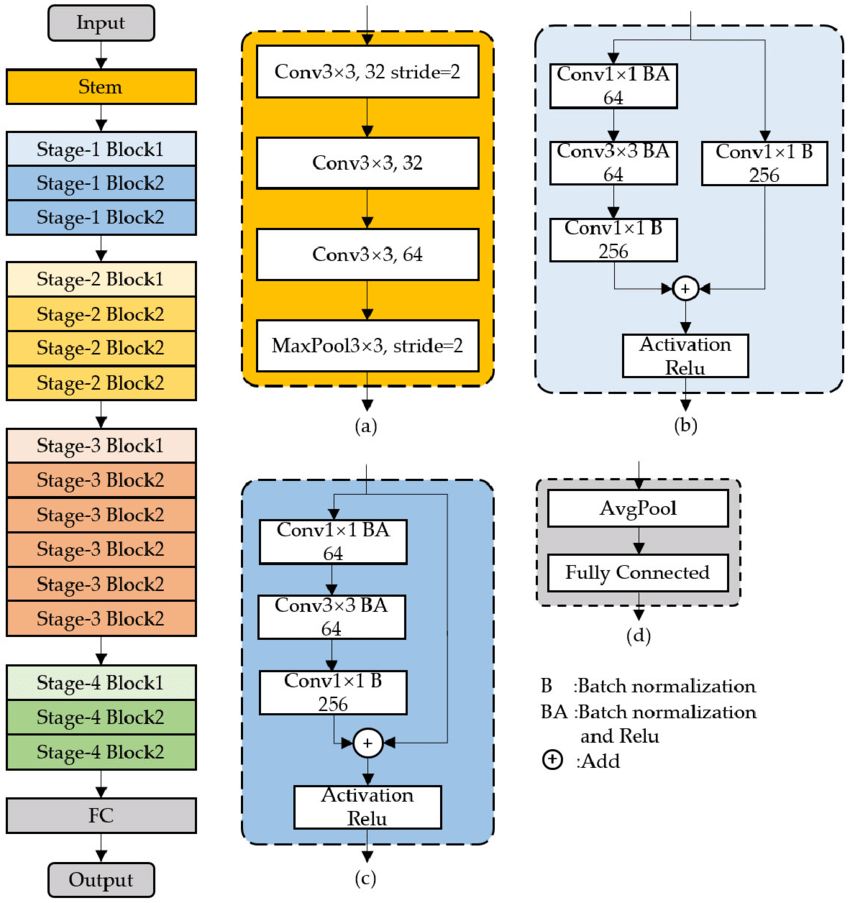


*   **Mạng gồm các khối kết nối tắt F(x)+x với x đầu vào F(x) đầu ra khi truyền thẳng hay là ánh xạ của x, kết nối này sẽ bỏ vài layer trung gian, giúp nếu mạng giữ được thông tin nhiều hơn khi trải qua train nhiều tầng độ sâu.**
*   **Gồm 2 module Identity block và Convolution block.**

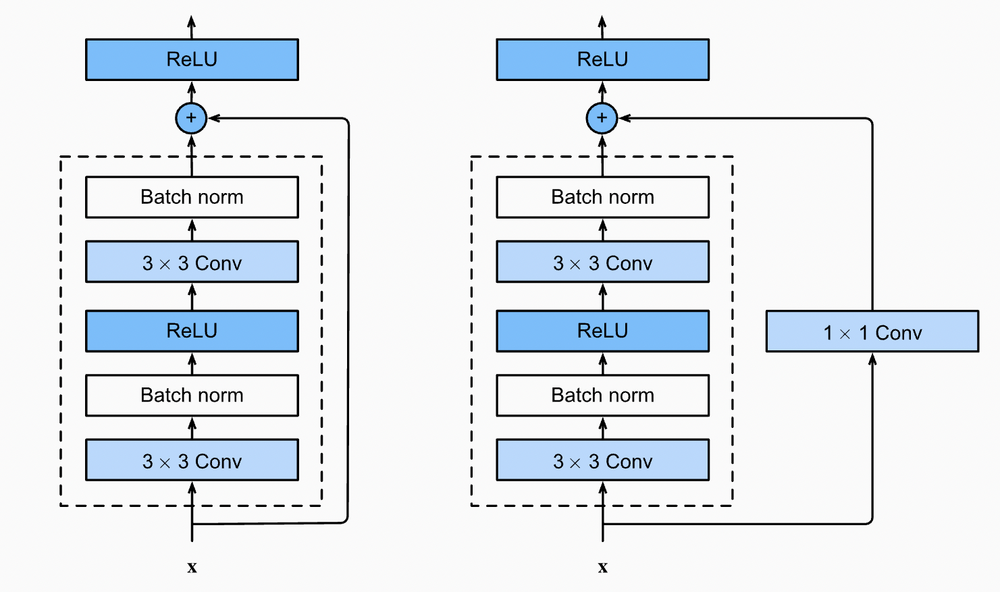

In [ ]:
import tensorflow as tf

In [ ]:
(X_train,y_train),(X_test,y_test)=tf.keras.datasets.cifar10.load_data()

In [ ]:
X_train.shape,X_test.shape

((50000, 32, 32, 3), (10000, 32, 32, 3))

In [ ]:
X_train=X_train.astype('float32')/255.0
X_test=X_train.astype('float32')/255.0
y_train=tf.keras.utils.to_categorical(y_train)
y_test=tf.keras.utils.to_categorical(y_test)

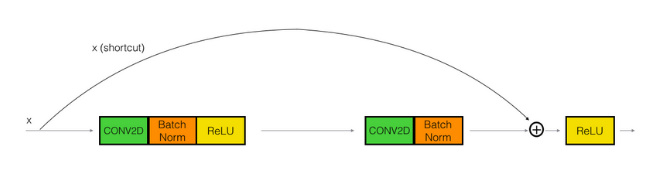

In [ ]:
def identity_block(X,kernel,filters):
    f1,f2,f3=filters
    X_shortcut=X
    X = tf.keras.layers.Conv2D(filters=f1, kernel_size=(1, 1), strides=(1, 1), padding='valid')(X)
    X = tf.keras.layers.BatchNormalization(axis=3)(X)
    X = tf.keras.layers.Activation('relu')(X)

    X = tf.keras.layers.Conv2D(filters=f2, kernel_size=(kernel, kernel), strides=(1, 1), padding='same')(X)
    X = tf.keras.layers.BatchNormalization(axis=3)(X)
    X = tf.keras.layers.Activation('relu')(X)

    X = tf.keras.layers.Conv2D(filters=f3, kernel_size=(1, 1), strides=(1, 1), padding='valid')(X)
    X = tf.keras.layers.BatchNormalization(axis=3)(X)

    X = tf.keras.layers.Add()([X, X_shortcut])
    X = tf.keras.layers.Activation('relu')(X)

    return X

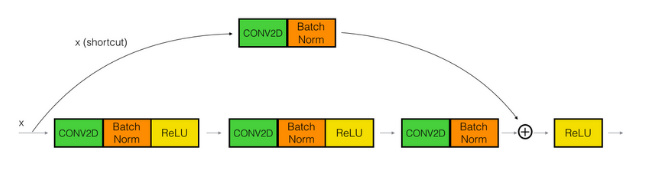

In [ ]:
def convolutional_block(X, kernel, filters, s=2):
    f1, f2, f3= filters
    X_shortcut = X

    X = tf.keras.layers.Conv2D(filters=f1, kernel_size=(1, 1), strides=(s, s), padding='valid')(X)
    X = tf.keras.layers.BatchNormalization(axis=3)(X)
    X = tf.keras.layers.Activation('relu')(X)

    X = tf.keras.layers.Conv2D(filters=f2, kernel_size=(kernel, kernel), strides=(1, 1), padding='same')(X)
    X = tf.keras.layers.BatchNormalization(axis=3)(X)
    X = tf.keras.layers.Activation('relu')(X)

    X = tf.keras.layers.Conv2D(filters=f3, kernel_size=(1, 1), strides=(1, 1), padding='valid')(X)
    X = tf.keras.layers.BatchNormalization(axis=3)(X)

    X_shortcut = tf.keras.layers.Conv2D(filters=f3, kernel_size=(1, 1), strides=(s, s), padding='valid')(X_shortcut)
    X_shortcut = tf.keras.layers.BatchNormalization(axis=3)(X_shortcut)

    X = tf.keras.layers.Add()([X, X_shortcut])
    X = tf.keras.layers.Activation('relu')(X)

    return X

In [ ]:
input_orgin = tf.keras.layers.Input(shape=(32, 32, 3))
#Resize(224,224)
input_resize = tf.keras.layers.experimental.preprocessing.Resizing(224, 224,
interpolation="bilinear",input_shape=(32,32,3))(input_orgin)
#Padding
X = tf.keras.layers.ZeroPadding2D((3, 3))(input_resize)
#Stem
X = tf.keras.layers.Conv2D(64, (7, 7), strides=(2, 2))(X)
X = tf.keras.layers.BatchNormalization(axis=3)(X)
X = tf.keras.layers.Activation('relu')(X)
X = tf.keras.layers.MaxPooling2D((3, 3), strides=(2, 2))(X)
#Stage 1 
X = convolutional_block(X, kernel=3, filters=[64, 64, 256], s=1)
X = identity_block(X, kernel=3, filters=[64, 64, 256])
X = identity_block(X, kernel=3, filters=[64, 64, 256])
#Stage 2
X = convolutional_block(X, kernel=3, filters=[128, 128, 512],s=2)
X = identity_block(X, kernel=3, filters=[128, 128, 512])
X = identity_block(X, kernel=3, filters=[128, 128, 512])
X = identity_block(X, kernel=3, filters=[128, 128, 512])
#Stage 3
X = convolutional_block(X, kernel=3, filters=[256, 256, 1024],s=2)
X = identity_block(X, kernel=3, filters=[256, 256, 1024])
X = identity_block(X, kernel=3, filters=[256, 256, 1024])
X = identity_block(X, kernel=3, filters=[256, 256, 1024])
X = identity_block(X, kernel=3, filters=[256, 256, 1024])
X = identity_block(X, kernel=3, filters=[256, 256, 1024])
#Stage 4
X = convolutional_block(X, kernel=3, filters=[512, 512, 2048], s=2)
X = identity_block(X, kernel=3, filters=[512, 512, 2048])
X = identity_block(X, kernel=3, filters=[512, 512, 2048])
#Average pool 2x2
X = tf.keras.layers.AveragePooling2D(pool_size=(2, 2), padding='same')(X)
#Fully Connected
X = tf.keras.layers.Flatten()(X)
X = tf.keras.layers.Dense(10,activation='softmax')(X)

In [ ]:
model=tf.keras.models.Model(inputs=input_orgin,outputs=X)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 resizing_1 (Resizing)          (None, 224, 224, 3)  0           ['input_2[0][0]']                
                                                                                                  
 zero_padding2d_1 (ZeroPadding2  (None, 230, 230, 3)  0          ['resizing_1[0][0]']             
 D)                                                                                               
                                                                                                  
 conv2d_5 (Conv2D)              (None, 112, 112, 64  9472        ['zero_padding2d_1[0][0]']   

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
X_valid=X_train[40000:]
y_valid=y_train[40000:]

In [ ]:
X_train=X_train[:40000]
y_train=y_train[:40000]

In [ ]:
history = model.fit(X_train,y_train, validation_data=(X_valid, y_valid), epochs=2, batch_size=32)

Epoch 1/2
1250/1250 [==============================] - 441s 341ms/step - loss: 2.1334 - accuracy: 0.3796 - val_loss: 1.6181 - val_accuracy: 0.4200
Epoch 2/2
1250/1250 [==============================] - 421s 337ms/step - loss: 1.3671 - accuracy: 0.5076 - val_loss: 1.1826 - val_accuracy: 0.5731
